# Understanding the Homography Matrix

The homography matrix describes the relationship between 2 camera images that observe the same plane. It tells you how points in image A are transformed and can be located in image B.

![Image showing the 4 cases of the homography matrix](understand-homography.png)

The homography matrix $\bf{H}$ can be viewed as a function that maps a point $(x,y)$ in an image A into another point $(x',y')$ in another image B.

It performs the mapping, $\bf{H}: (x,y) \rightarrow (x',y')$, by first applying a linear combination on the input points $(x,y)$ as an affine transform

$$
x' = h_{11}x + h_{12}y + h_{13} \\
y' = h_{21}x + h_{22}y + h_{23}
$$

and then it is normalised by $h_{31}x + h_{32}y + h_{33}$(which makes it into a projective transform). The entire operation can be viewed as

$$
x' = \frac{h_{11}x + h_{12}y + h_{13}}{h_{31}x + h_{32}y + h_{33}}
\text{ and }
y' = \frac{h_{21}x + h_{22}y + h_{23}}{h_{31}x + h_{32}y + h_{33}}
$$


It is more common to rewrite it in homogeneous matrix vector multiplication form as

$$
\left[ {\begin{array}{c}
    x' \\
    y' \\
    1  \\
\end{array}} \right] 
=
\left[ {\begin{array}{ccc}
h_{11} & h_{12} & h_{13} \\
h_{21} & h_{22} & h_{23} \\
h_{31} & h_{32} & h_{33} 
\end{array}} \right]
\left[ {\begin{array}{c}
    x \\
    y \\
    1  \\
\end{array}} \right] 

\\
\text{ also as } \\
\bf{x'} = \bf{H} \bf{x}
$$

## Special Cases of the Homography Matrix 
To fully understand the homography matrix, we need to examine 4 types of transformations, that we can view as special cases of the homography matrix. They are
* Euclidean
* Similarity
* Affine
* Projective

All in increasing order of complexity.

## Euclidean Transformations
This is the simplest case and easiest to understand - It is composed of rotations and translations - Here an image undergoes a rigid-body transformation.
To create a homography matrix that represents an euclidean (rigid-body) transformation, our matrix requires only 3 parameters: 
The angle $\alpha$ of rotation and the $(t_x, t_y)$ translations.

$$
H_{e} = 
\begin{bmatrix}
cos(\alpha) & -sin(\alpha) & t_x \\
sin(\alpha) & cos(\alpha) & t_y \\
0 & 0 & 1
\end{bmatrix}
$$

Lets see what this looks like for a given point pair ${(x_1,y_1), (x'_1, y'_1)}$ in homogeneous coordinates
$$
\frac{x'_1}{1} = \frac{x cos(\alpha) -sin(\alpha)y + t_x}{0 + 0 + 1}
\hspace3em
\frac{y'_1}{1} = \frac{x sin(\alpha) + cos(\alpha)y + t_y}{0 + 0 + 1}
$$

The last row of the homography matrix has to be [0 0 1] as we are not changing the z-axis i.e the planes remain the same.

Using the image of the cathedral, we can illustrate this as:

First, load in the image that will be transformed


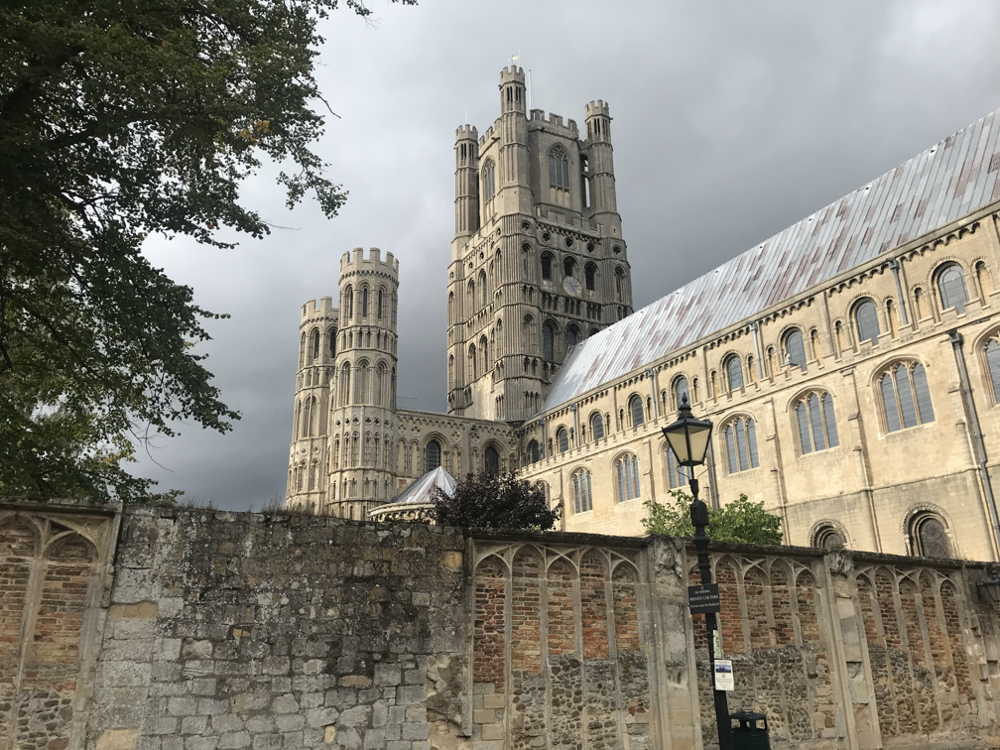

New image size (1008, 756)


In [356]:
from PIL import Image
import numpy as np
import cv2
import random

im1 = Image.open("IMG_5965.png")
im1 = im1.resize(tuple([round(i * 0.25) for i in im1.size])) # downsample it by a factor of 4
display(im1)
print(f"New image size {im1.size}")


Next you'd define write a function that can produce the homography matrix for the euclidean transform for any given angle and (x,y) translations.

In [547]:
from math import cos, sin, radians

def center_pt(H, im_size):
    im1_center  = np.array([x//2 for x in im_size] + [1]) # our reference guide
    warped_center = H @ im1_center
    # compute the (x,y) difference to center the transformed image back into our reference guide
    delta_txyz = (im1_center[0] - warped_center[0], im1_center[1] - warped_center[1], 1)
    return delta_txyz

def center_tf(H1, im_size):
    delta_txyz = center_pt(H1, im_size)
    H2 = euclidean_tf(0, *delta_txyz)
    return H2 @ H1

def euclidean_tf(angle, tx, ty, tz=1):
    """
    Construct an euclidean transformation matrix. Input parameters are
    - angle: the rotation in degrees
    - tx: the translation in pixels

    Returns a `3x3` matrix
    """
    # print(tx, ty, tz)
    row_1 = [cos(radians(angle)), -sin(radians(angle)), tx]
    row_2 = [sin(radians(angle)), cos(radians(angle)), ty]
    row_3 = [0, 0, tz]
    return np.array([row_1, row_2, row_3])

With the cathedral image and `euclidean_tf` function in place. 

Construct an euclidean transformation of the cathedral with a rotation of $15^\circ$, an x-translation of $120$ pixels and a y-translation of $-20$ pixels.

Rotating by -89.09026633265114
Euclidean Homography Matrix:
[[ 1.58771807e-02  9.99873950e-01  1.20000000e+02]
 [-9.99873950e-01  1.58771807e-02 -2.00000000e+01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
(-1.9544520148566562, 895.9348963166888, 1)
Center transform: 
[[ 1.58771807e-02  9.99873950e-01  1.18045548e+02]
 [-9.99873950e-01  1.58771807e-02  8.75934896e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


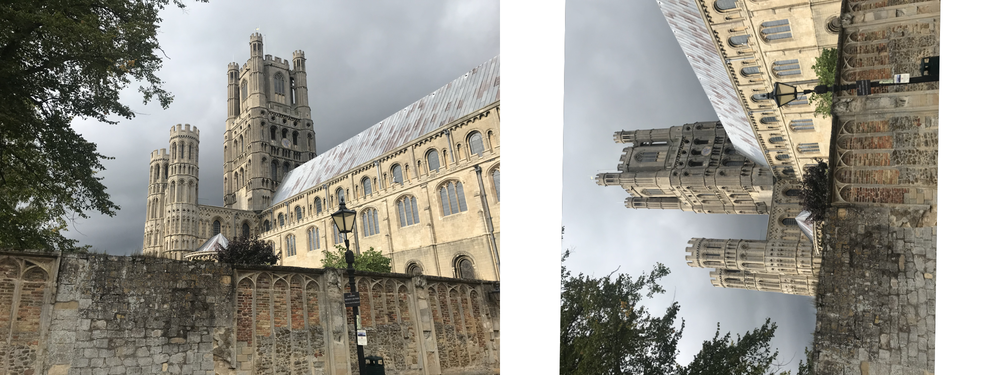

In [549]:
rotation_angle = random.uniform(-360,360)
print(f"Rotating by {rotation_angle}")
H1 = euclidean_tf(rotation_angle, 120, -20)
print("Euclidean Homography Matrix:")
print(H1)

H2 = center_tf(H1, im1.size)
print(f"Center transform: \n{H2}")

im1_np = np.asarray(im1)
# See https://docs.opencv.org/4.x/da/d54/group__imgproc__transform.html#ga0203d9ee5fcd28d40dbc4a1ea4451983 for more
# the description of the `warpAffine` function
# euclidean_im1 = cv2.warpAffine(im1_np, H[0:2,:], im1.size)
euclidean_im1 = cv2.warpPerspective(im1_np, H2, im1.size)

# to visualise them side by side
joined_im = np.hstack([im1_np, euclidean_im1])
display(Image.fromarray(joined_im))

# save the results to disk
# import os
# if not os.path.exists("results"):
#     os.mkdir("results")
# im1.save("results/original_im1.png")
# Image.fromarray(euclidean_im1).save("results/euclidean_im1.png")
# Image.fromarray(joined_im).save("results/joined_im1.png")

In [359]:
from IPython.display import Video
Video("euclidean-transform-vid.mp4", html_attributes="loop autoplay")

## Similarity Transformations
Next up is the similarity transform and it builds on the euclidean transformation by adding one one dimension - scale $s$. 
This transformation is now composed of - scale, rotations and translations.

To create a homography matrix that represents an similarity (rigid-body with scale) transformation, our matrix requires only 4 parameters: 


The angle $\alpha$ of rotation, the $(t_x, t_y)$ translations and the scale $s$

$$
H_{s} = 
\begin{bmatrix}
s \times cos(\alpha) & -s \times sin(\alpha) & t_x \\
s \times sin(\alpha) & s \times cos(\alpha) & t_y \\
0 & 0 & 1
\end{bmatrix}
$$

Lets see what this looks like for a given point pair ${(x_1,y_1), (x'_1, y'_1)}$ in homogeneous coordinates
$$
\frac{x'_1}{1} = \frac{sx \times cos(\alpha) -sy \times sin(\alpha) + t_x}{0 + 0 + 1}
\hspace3em
\frac{y'_1}{1} = \frac{sx \times sin(\alpha) +sy \times cos(\alpha) + t_y}{0 + 0 + 1}
$$

The last row of the homography matrix has to be [0 0 1] as we are not changing the z-axis i.e the planes remain the same.

Building on the cathedral example, we can define a function that builds a similarity transform as


In [495]:
def similarity_tf(angle, tx, ty, s):
    """
    Construct a similarity transformation matrix. Input parameters are
    - angle: the rotation in degrees
    - tx: the x translation in pixels
    - y: the y translation in pixels
    - s: the scale factor to apply to each point

    Returns a `3x3` matrix
    """
    row_1 = [s * cos(radians(angle)), -s * sin(radians(angle)), tx]
    row_2 = [s * sin(radians(angle)), s * cos(radians(angle)), ty]
    row_3 = [0,0,1]
    return np.array([row_1, row_2, row_3])

define a similarity transformation with 97 degree rotation, a scale factor of 0.5 (i.e zoom out by 2).

Rather than apply the transformation directly as we did in the euclidean transformation. Lets make a better transformation that is  centered in the image frame.
First rotate and scale the image

In [361]:
# rotation and scale only transformation
H1 = similarity_tf(97, 0, 0, 0.5)
print("Similarity Homography Matrix (H1):")
print(H1)

Similarity Homography Matrix (H1):
[[-0.06093467 -0.49627308  0.        ]
 [ 0.49627308 -0.06093467  0.        ]
 [ 0.          0.          1.        ]]


Next we compute the desired image center by using the original image center as a reference guide. This reference center is then rotated and scaled using our current similarity transform `H1`

Original center = [504 378   1]
Warped center = [-218.3022972   227.08832431    1.        ]
Similarity Homography Matrix (H):
[[-6.09346717e-02 -4.96273076e-01  7.22302297e+02]
 [ 4.96273076e-01 -6.09346717e-02  1.50911676e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


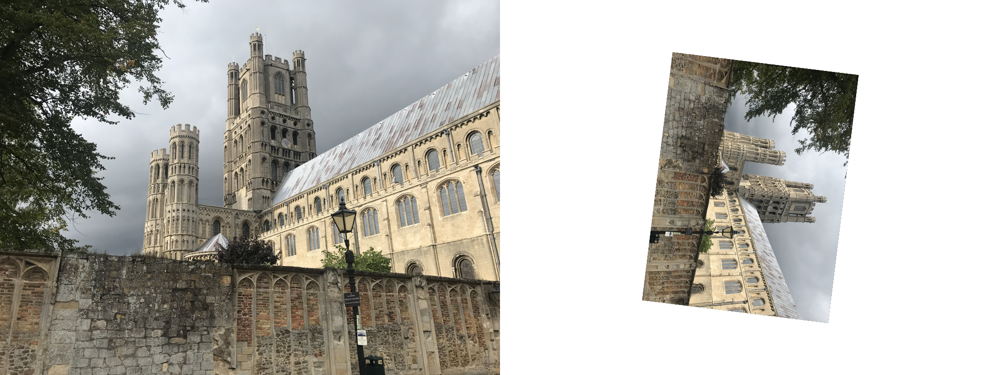

In [362]:
im1_center  = np.array([x//2 for x in im1.size] + [1]) # our reference guide
warped_center = H1 @ im1_center
print(f"Original center = {im1_center}\nWarped center = {warped_center}")

# compute the (x,y) difference to center the transformed image back into our reference guide
delta_txy = (im1_center[0] - warped_center[0], im1_center[1] - warped_center[1])
H2 = similarity_tf(0, delta_txy[0], delta_txy[1], 1)
H = H2 @ H1 # H1(rotate and scale) -> H2 (center in frame)
print("Similarity Homography Matrix (H):")
print(H)
similarity_im1 = cv2.warpAffine(im1_np, H[0:2,:], im1.size)

# to visualise them side by side
joined_im = np.hstack([im1_np, similarity_im1])
display(Image.fromarray(joined_im))

# save the results to disk
Image.fromarray(similarity_im1).save("results/similarity_im1.png")
Image.fromarray(joined_im).save("results/joined_similarity_im1.png")

## Affine Transform
This is a more general form of the similarity transform but much more expressive. Written as

$$
H_{a} = 
\begin{bmatrix}
a_{11} & a_{12} & t_x \\
a_{21} & a_{22} & t_y \\
0 & 0 & 1
\end{bmatrix}
$$

As this is much more expressive, the image can be deformed in a multiple of ways including shearing and stretching but with affine transforms, parrallel lines always remain parallel after transformation.

Compared to the similarity and euclidean, the angles in the image are no longer preserved because the rotation the image undergoes is no longer parameterised by $cos(\theta)$ and $sin(\theta)$ - Therefore, in affine transforms, the parallelness of lines are preserved but not the angles (due to the removal of the trigonometric constraints).

Lets define a function to create the affine transform for us as
> NB: This function only accepts translation parameters and generates random values for the rest

In [493]:
import random

def affine_tf(tx, ty):
    """
    Construct an affine transformation matrix. Input parameters are
    - angle: the rotation in degrees
    - tx: the x translation in pixels
    - y: the y translation in pixels
    - s: the scale factor to apply to each point

    Returns a `3x3` matrix
    """
    row_1 = [random.uniform(-3,3), random.uniform(-3,3), tx]
    row_2 = [random.uniform(-3,3), random.uniform(-3,3), ty]
    row_3 = [0,0,1]
    return np.array([row_1, row_2, row_3])

Original center = [504 378   1]
Warped center = [-91.96557136 795.17814214   1.        ]
Affine transformation: 
[[ 4.52627176e-01 -8.73253090e-01  6.05965571e+02]
 [-3.14473132e-01  2.48326085e+00 -4.02178142e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


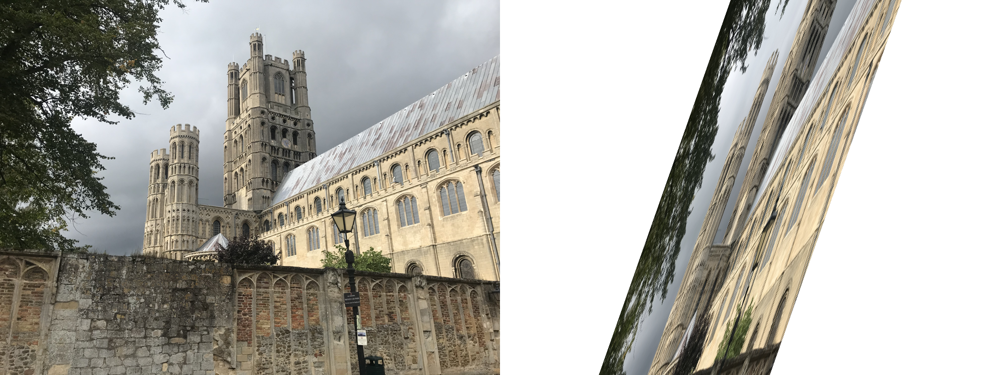

In [494]:
H1 = affine_tf(10,15)
im1_center  = np.array([x//2 for x in im1.size] + [1]) # our reference guide
warped_center = H1 @ im1_center
print(f"Original center = {im1_center}\nWarped center = {warped_center}")

# compute the (x,y) difference to center the transformed image back into our reference guide
delta_txy = (im1_center[0] - warped_center[0], im1_center[1] - warped_center[1])
H2 = euclidean_tf(0, delta_txy[0], delta_txy[1])
H = H2 @ H1 # H1(scale and shear) -> H2 (center in frame)
print(f"Affine transformation: \n{H}")
affine_im1 = cv2.warpAffine(im1_np, H[0:2,:], im1.size)


# to visualise them side by side
joined_im = np.hstack([im1_np, affine_im1])
display(Image.fromarray(joined_im))

# save the results to disk
Image.fromarray(affine_im1).save("results/affine_im1.png")
Image.fromarray(joined_im).save("results/joined_affine_im1.png")

## Projective Transformation

This is the most expressive transform and can perform all the previous transforms (euclidean, similarity, affine) mentioned.

We can simplify the homography matrix by setting $h_{9} = 1$ as this parameter doesn't determine how the points changed in the images but simply performs the visual effect of changing the z-plane which will produce a zoom-in/zoom-out effect.
$$
\begin{bmatrix}
h_{1} & h_{2} & h_{3} \\
h_{4} & h_{5} & h_{6} \\
h_{7} & h_{8} & \bf{1}
\end{bmatrix}
$$

> It is worth experimenting with $h_{9}$ and seeing the different effects it has on the resulting image. In terms of the 2D image, changes in $h_{9}$ have no effect, why?, because all the points lie on the same plane. Changing $h_{9}$ only changes the z-plane, which when rendered as 2D, can either look the same or when the perspective is angled, it can look like a zoom-in/zoom-out effect (try imagine a 2D plane being pulled by a crane)

In [477]:
def projective_tf(tx, ty):
    """
    Construct an projective transformation matrix. Input parameters are
    - tx: the x translation in pixels
    - y: the y translation in pixels

    NB: This projective transformation has been carefully constrained to produce projective transforms within certain ranges for the purpose of making it easier to visualise. Feel free to modify it 

    Returns a `3x3` matrix
    """
    row_1 = [random.uniform(-1.5,1.5), random.uniform(-0.025,0.025), tx]
    row_2 = [random.uniform(-0.025,0.025), random.uniform(-1.5,1.5), ty]
    row_3 = [random.uniform(-0.025,0.025), random.uniform(-0.025,0.025), random.uniform(1,10)]
    return np.array([row_1, row_2, row_3])

Apply the projective transform to the cathedral image

Projective transform: [[-0.6679984  -0.00458099  0.        ]
 [-0.00686326 -0.16150845  0.        ]
 [ 0.00182847 -0.02136112  1.77966135]]
Delta = (842.4028092591415, 442.509275360071)
Center transform: 
[[ 8.72313125e-01 -1.79992463e+01  1.49919172e+03]
 [ 8.02253389e-01 -9.61400101e+00  7.87516652e+02]
 [ 1.82847387e-03 -2.13611174e-02  1.77966135e+00]]


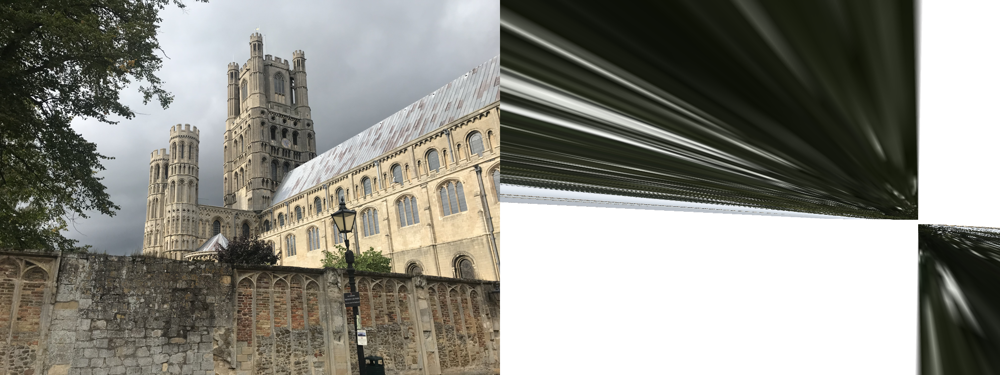

In [481]:

H1 = projective_tf(0,0)
print(f"Projective transform: {H1}")
delta_txy = center_tf(H1, im1.size)
print(f"Delta = {delta_txy}")
H2 = euclidean_tf(0, delta_txy[0], delta_txy[1])
H = H2 @ H1 # H1(scale and shear) -> H2 (center in frame)
print(f"Center transform: \n{H}")
proj_im1 = cv2.warpPerspective(im1_np, H, im1.size)

# to visualise them side by side
joined_im = np.hstack([im1_np, proj_im1])
display(Image.fromarray(joined_im))

# save the results to disk
Image.fromarray(proj_im1).save("results/projective_im1.png")
Image.fromarray(joined_im).save("results/joined_projective_im1.png")

# Advanced: Decomposing the 3D Image Formation process to Planar Homography

This final section assumes some advanced knowledge of the image formation process. It builds on concepts mentioned in [my previous camera calibration article](https://araintelligence.com/blogs/computer-vision/geometric-vision/camera_calibration)

![pin hole camera](https://cdn.araintelligence.com/images/calibration/pinholeCamera.png)


# References
* Computer Vision by Richard Szelski